In [1]:
# import libraries

In [2]:
!pip install seaborn

In [10]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) # adjust the configuration of the plots we will create

# Read in the data

df = pd.read_csv(r'/Users/6ixbio/Downloads/movies.csv')

In [7]:
# Look at the data 

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [25]:
# finding missing data 

for col in df.columns:
    ptc_missing = np.mean(df[col].isnull( ))
    print('{} - {}%'.format(col, ptc_missing))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [26]:
# Drop Null values

drop = df.dropna()

In [27]:
# data types from columns 

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [29]:
# data cleaning (changing data types to intergers)

df['budget'] = df['budget'].astype('Int64')
df['gross'] = df['gross'].astype('Int64')
df['runtime'] = df['runtime'].astype('Int64')
df['votes'] = df['votes'].astype('Int64')

In [95]:
df.head

<bound method NDFrame.head of       name  rating  genre  year  released  score    votes  director  writer  \
0     4706       6      6  1980      1308    8.4   927000      1800    2841   
1     3943       6      1  1980      1131    5.8    65000      1581    1160   
2     3654       4      0  1980      1363    8.7  1200000       759    1822   
3      205       4      4  1980      1131    7.7   221000       891    1416   
4      734       6      4  1980      1174    7.3   108000       721     352   
5     1513       6      9  1980      1928    6.4   123000      1763    3091   
6     3944       6      0  1980      1363    7.9   188000       976     578   
7     3134       6      3  1980       531    8.2   330000      1272    1259   
8     3745       4      0  1980      1350    6.8   101000      1611    1405   
9     4415       6      3  1980      1760    7.0    10000      2017     281   
10     333       4      0  1980       511    6.1    18000       238    2819   
11    4193       4    

In [96]:
# Creating a new column to only extract the year from released column

df['yearcorrect'] = df['released'].astype('str').str[:4]

df.head

<bound method NDFrame.head of       name  rating  genre  year  released  score    votes  director  writer  \
0     4706       6      6  1980      1308    8.4   927000      1800    2841   
1     3943       6      1  1980      1131    5.8    65000      1581    1160   
2     3654       4      0  1980      1363    8.7  1200000       759    1822   
3      205       4      4  1980      1131    7.7   221000       891    1416   
4      734       6      4  1980      1174    7.3   108000       721     352   
5     1513       6      9  1980      1928    6.4   123000      1763    3091   
6     3944       6      0  1980      1363    7.9   188000       976     578   
7     3134       6      3  1980       531    8.2   330000      1272    1259   
8     3745       4      0  1980      1350    6.8   101000      1611    1405   
9     4415       6      3  1980      1760    7.0    10000      2017     281   
10     333       4      0  1980       511    6.1    18000       238    2819   
11    4193       4    

In [51]:
df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162,Dece
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181,Apri
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194,Dece
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138,Dece
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149,Apri
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000,<NA>,NaN,90,Octo
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,<NA>,<NA>,Cactus Blue Entertainment,90,Febr
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750,<NA>,Embi Productions,<NA>,Apri
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",NaN,<NA>,James Randall,James Randall,Christina Roz,United States,15000,<NA>,NaN,120,Octo


In [97]:
pd.set_option('display.min_rows', None)

df.head

<bound method NDFrame.head of       name  rating  genre  year  released  score    votes  director  writer  \
0     4706       6      6  1980      1308    8.4   927000      1800    2841   
1     3943       6      1  1980      1131    5.8    65000      1581    1160   
2     3654       4      0  1980      1363    8.7  1200000       759    1822   
3      205       4      4  1980      1131    7.7   221000       891    1416   
4      734       6      4  1980      1174    7.3   108000       721     352   
5     1513       6      9  1980      1928    6.4   123000      1763    3091   
6     3944       6      0  1980      1363    7.9   188000       976     578   
7     3134       6      3  1980       531    8.2   330000      1272    1259   
8     3745       4      0  1980      1350    6.8   101000      1611    1405   
9     4415       6      3  1980      1760    7.0    10000      2017     281   
10     333       4      0  1980       511    6.1    18000       238    2819   
11    4193       4    

In [73]:
# Droping Duplictes of title names

df['company'].drop_duplicates().sort_values(ascending=False)
df['name'].drop_duplicates().sort_values(ascending=False)
df = df.dropna(subset=['budget'])
df = df.dropna(subset=['gross'])

df.head

<bound method NDFrame.head of                                                    name     rating      genre  \
0                                           The Shining          R      Drama   
1                                       The Blue Lagoon          R  Adventure   
2        Star Wars: Episode V - The Empire Strikes Back         PG     Action   
3                                             Airplane!         PG     Comedy   
4                                            Caddyshack          R     Comedy   
5                                       Friday the 13th          R     Horror   
6                                    The Blues Brothers          R     Action   
7                                           Raging Bull          R  Biography   
8                                           Superman II         PG     Action   
9                                       The Long Riders          R  Biography   
10                                Any Which Way You Can         PG     Action  

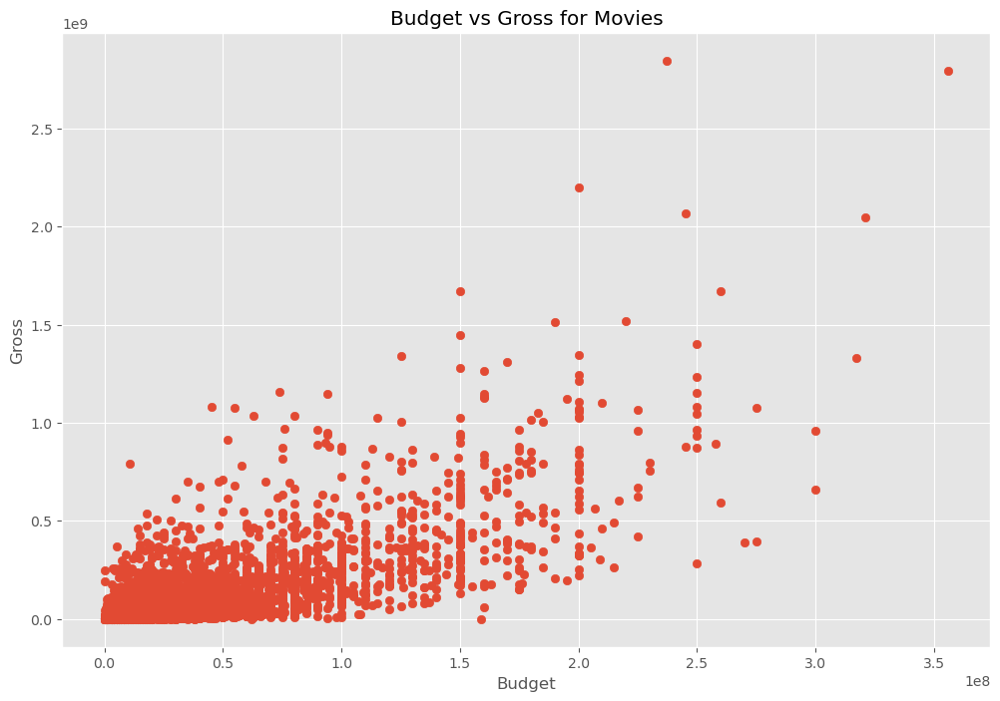

In [74]:
# Scatter plot with budget and gross

plt.scatter(x = df['budget'], y = df['gross'])
plt.xlabel('Budget')
plt.ylabel('Gross')
plt.title('Budget vs Gross for Movies')
plt.show()

<Axes: title={'center': 'Budget vs Gross for Movies'}, xlabel='budget', ylabel='gross'>

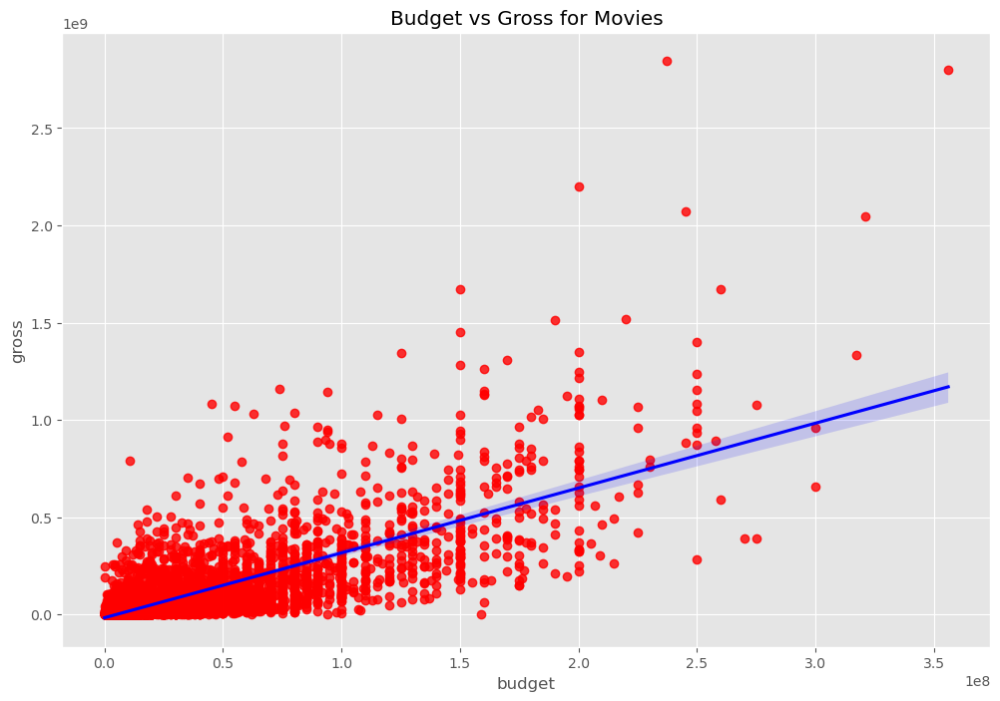

In [79]:
# Plot budget vs gross using seaborn 

df['budget'] = df['budget'].astype(float)
df['gross'] = df['gross'].astype(float)
plt.xlabel('Budget')
plt.ylabel('Gross')
plt.title('Budget vs Gross for Movies')
sns.regplot(x='budget', y='gross', data=df, scatter_kws={'color': "red"}, line_kws={'color': "blue"})

In [82]:
# let start looking at correlation

df.corr()

# high correlation between budget and gross

/var/folders/lz/8fgmndqn72q661r4w0_k459c0000gn/T/ipykernel_8033/2310814698.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,year,score,votes,budget,gross,runtime
year,1.000000,0.055174,0.205758,0.327781,0.274264,0.074203
score,0.055174,1.000000,0.473809,0.071792,0.222143,0.414580
votes,0.205758,0.473809,1.000000,0.440021,0.614904,0.352437
budget,0.327781,0.071792,0.440021,1.000000,0.740395,0.318595
gross,0.274264,0.222143,0.614904,0.740395,1.000000,0.275596
runtime,0.074203,0.414580,0.352437,0.318595,0.275596,1.000000


/var/folders/lz/8fgmndqn72q661r4w0_k459c0000gn/T/ipykernel_8033/1557025928.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr(method='pearson')


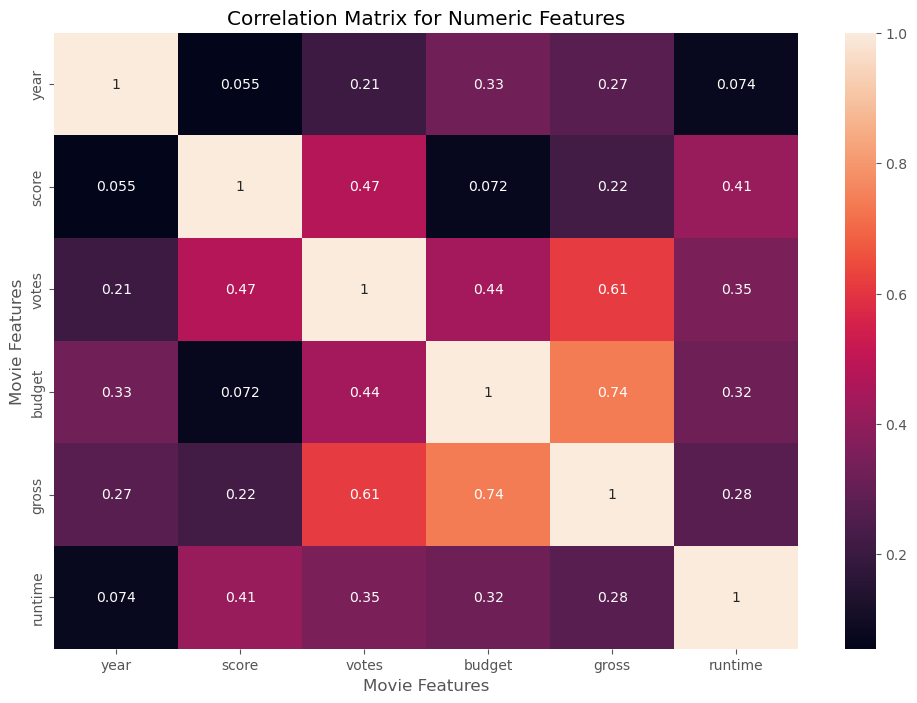

In [84]:
correlation_matrix = df.corr(method='pearson')

sns.heatmap(correlation_matrix,annot=True)
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.title('Correlation Matrix for Numeric Features')

plt.show()

In [85]:
#Lets look at company

df.head

<bound method NDFrame.head of                                                    name     rating      genre  \
0                                           The Shining          R      Drama   
1                                       The Blue Lagoon          R  Adventure   
2        Star Wars: Episode V - The Empire Strikes Back         PG     Action   
3                                             Airplane!         PG     Comedy   
4                                            Caddyshack          R     Comedy   
5                                       Friday the 13th          R     Horror   
6                                    The Blues Brothers          R     Action   
7                                           Raging Bull          R  Biography   
8                                           Superman II         PG     Action   
9                                       The Long Riders          R  Biography   
10                                Any Which Way You Can         PG     Action  

In [87]:
df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized                    

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,4706,6,6,1980,1308,8.4,927000,1800,2841,700,46,19000000.0,4.699877e+07,1432,146,11
1,3943,6,1,1980,1131,5.8,65000,1581,1160,215,47,4500000.0,5.885311e+07,454,104,10
2,3654,4,0,1980,1363,8.7,1200000,759,1822,1161,47,18000000.0,5.383751e+08,949,124,11
3,205,4,4,1980,1131,7.7,221000,891,1416,1478,47,3500000.0,8.345354e+07,1114,88,10
4,734,6,4,1980,1174,7.3,108000,721,352,272,47,6000000.0,3.984634e+07,1089,98,10
5,1513,6,9,1980,1928,6.4,123000,1763,3091,156,47,550000.0,3.975460e+07,1114,95,13
6,3944,6,0,1980,1363,7.9,188000,976,578,861,47,27000000.0,1.152299e+08,1403,133,11
7,3134,6,3,1980,531,8.2,330000,1272,1259,1473,47,18000000.0,2.340243e+07,392,129,7
8,3745,4,0,1980,1350,6.8,101000,1611,1405,596,47,54000000.0,1.081857e+08,550,127,11
9,4415,6,3,1980,1760,7.0,10000,2017,281,403,47,10000000.0,1.579519e+07,1397,100,13


In [98]:
df.head

<bound method NDFrame.head of       name  rating  genre  year  released  score    votes  director  writer  \
0     4706       6      6  1980      1308    8.4   927000      1800    2841   
1     3943       6      1  1980      1131    5.8    65000      1581    1160   
2     3654       4      0  1980      1363    8.7  1200000       759    1822   
3      205       4      4  1980      1131    7.7   221000       891    1416   
4      734       6      4  1980      1174    7.3   108000       721     352   
5     1513       6      9  1980      1928    6.4   123000      1763    3091   
6     3944       6      0  1980      1363    7.9   188000       976     578   
7     3134       6      3  1980       531    8.2   330000      1272    1259   
8     3745       4      0  1980      1350    6.8   101000      1611    1405   
9     4415       6      3  1980      1760    7.0    10000      2017     281   
10     333       4      0  1980       511    6.1    18000       238    2819   
11    4193       4    

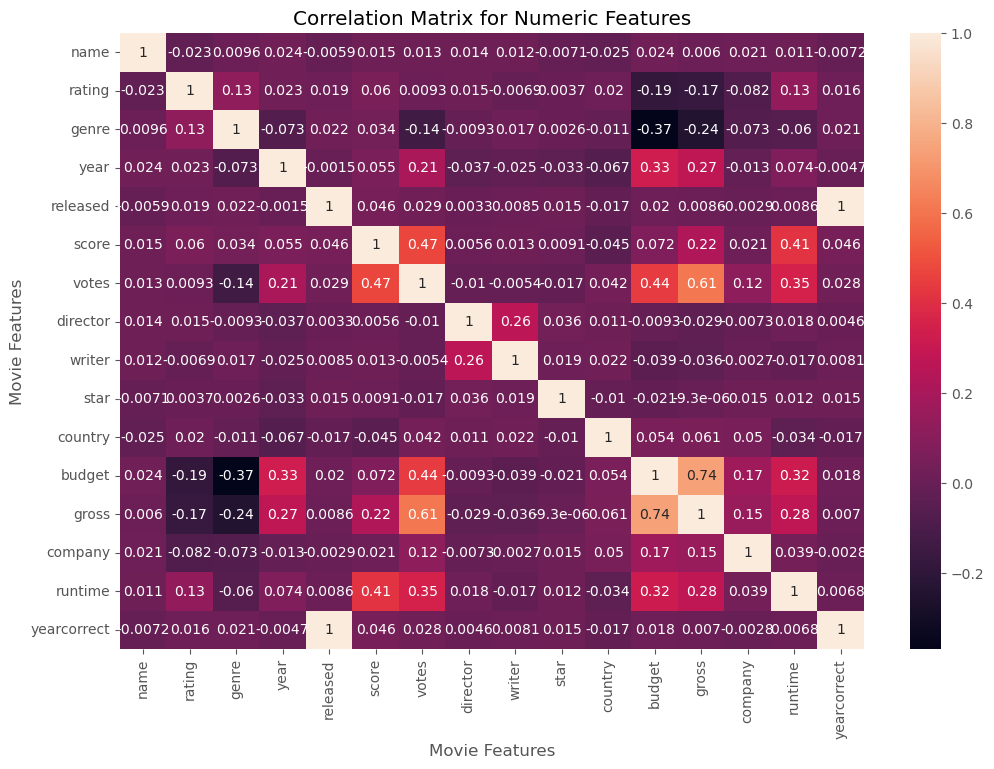

In [90]:
correlation_matrix = df_numerized.corr(method='pearson')

sns.heatmap(correlation_matrix,annot=True)
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.title('Correlation Matrix for Numeric Features')

plt.show() 

In [91]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
name,1.000000,-0.023013,0.009617,0.024435,-0.005896,0.014955,0.012915,0.013699,0.011602,-0.007109,-0.024555,0.023698,0.005966,0.021209,0.010800,-0.007216
rating,-0.023013,1.000000,0.128102,0.022668,0.018836,0.059550,0.009255,0.014847,-0.006923,0.003737,0.020148,-0.186892,-0.168814,-0.082189,0.133239,0.016205
genre,0.009617,0.128102,1.000000,-0.073026,0.021712,0.034061,-0.136457,-0.009303,0.017500,0.002619,-0.010847,-0.368900,-0.244380,-0.073293,-0.060186,0.021016
year,0.024435,0.022668,-0.073026,1.000000,-0.001481,0.055174,0.205758,-0.036936,-0.024568,-0.032770,-0.066662,0.327781,0.274264,-0.013062,0.074203,-0.004720
released,-0.005896,0.018836,0.021712,-0.001481,1.000000,0.046424,0.029029,0.003341,0.008514,0.015363,-0.017231,0.019888,0.008614,-0.002927,0.008619,0.996190
score,0.014955,0.059550,0.034061,0.055174,0.046424,1.000000,0.473809,0.005573,0.012860,0.009121,-0.044690,0.071792,0.222143,0.021054,0.414580,0.045603
votes,0.012915,0.009255,-0.136457,0.205758,0.029029,0.473809,1.000000,-0.010198,-0.005394,-0.017140,0.042146,0.440021,0.614904,0.119366,0.352437,0.027719
director,0.013699,0.014847,-0.009303,-0.036936,0.003341,0.005573,-0.010198,1.000000,0.262940,0.036289,0.011108,-0.009340,-0.029366,-0.007337,0.018082,0.004565
writer,0.011602,-0.006923,0.017500,-0.024568,0.008514,0.012860,-0.005394,0.262940,1.000000,0.019273,0.022153,-0.039420,-0.035999,-0.002658,-0.016672,0.008114
star,-0.007109,0.003737,0.002619,-0.032770,0.015363,0.009121,-0.017140,0.036289,0.019273,1.000000,-0.010135,-0.021282,-0.000009,0.015086,0.012439,0.014537


In [92]:
correlation_matrix = df_numerized.corr()

corr_pairs = correlation_matrix.unstack()

corr_pairs

name         name           1.000000
             rating        -0.023013
             genre          0.009617
             year           0.024435
             released      -0.005896
             score          0.014955
             votes          0.012915
             director       0.013699
             writer         0.011602
             star          -0.007109
             country       -0.024555
             budget         0.023698
             gross          0.005966
             company        0.021209
             runtime        0.010800
             yearcorrect   -0.007216
rating       name          -0.023013
             rating         1.000000
             genre          0.128102
             year           0.022668
             released       0.018836
             score          0.059550
             votes          0.009255
             director       0.014847
             writer        -0.006923
             star           0.003737
             country        0.020148
 

In [93]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

budget       genre         -0.368900
genre        budget        -0.368900
gross        genre         -0.244380
genre        gross         -0.244380
rating       budget        -0.186892
budget       rating        -0.186892
rating       gross         -0.168814
gross        rating        -0.168814
votes        genre         -0.136457
genre        votes         -0.136457
rating       company       -0.082189
company      rating        -0.082189
genre        company       -0.073293
company      genre         -0.073293
year         genre         -0.073026
genre        year          -0.073026
country      year          -0.066662
year         country       -0.066662
genre        runtime       -0.060186
runtime      genre         -0.060186
score        country       -0.044690
country      score         -0.044690
writer       budget        -0.039420
budget       writer        -0.039420
year         director      -0.036936
director     year          -0.036936
writer       gross         -0.035999
g

In [94]:
high_corr = sorted_pairs[(sorted_pairs) >0.5]

high_corr

votes        gross          0.614904
gross        votes          0.614904
             budget         0.740395
budget       gross          0.740395
released     yearcorrect    0.996190
yearcorrect  released       0.996190
name         name           1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
writer       writer         1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
runtime      runtime        1.000000
yearcorrect  yearcorrect    1.000000
dtype: float64

In [ ]:
# votes and budget have the high correlation to gross earnings 
# company has low correlation  